## Classificação

### 1. Contextualização

A base de dados escolhida para o desenvolvimento das atividades de classificação foi a Volcanoes on Venus, que é um conjunto de dados coletado entre os anos 1990 e 1994, pela sonda espacial Magellan, que mapeou a superfície de Vênus com um radar de abertura sintética, por conta da atmosfera muito densa do planeta. Acredita-se que possa ter existido vida em Vênus, milhões de anos atrás, que fora extinta devido à alta atividade vulcânica, transformando toda a atmosfera em dióxido de carbono e dióxido de enxofre, extinguindo assim, qualquer forma de vida que possa ter aparecido. Muitos estudos relacionados aos vulcões de Vênus apareceram após essa teoria e identificá-los foi um desafio. 

### 2. Dataset

O dataset de treino apresenta 7000 imagens de 110 pixels por 110 pixels, cada um deste podendo ser de 0 a 255 (contraste), em um arquivo .csv, onde cada linha é uma imagem com 12100 colunas (110x110). Ou seja, a matriz 110x110 está em formato de vetor. 
Além das imagens, existe um dataset que rotula cada uma dessas imagens, o que categoriza o aprendizado em supervisionado. Os atributos desse conjunto de dados são:

 * **Volcano?**: Se existe a possibilidade de ter algum vulcão na imagem, podendo ser 1 ou 0. Caso for 0 os outros atributos serão NaN.

 * **Type**: Classifica a possibilidade de ser um vulcão na imagem de 1 a 4, onde 1 é definitivamente um vulcão e 4 apenas uma ponta é vista na imagem.

 * **Radius**: O raio do vulcão em pixels. É um float que não possui classificação (se tornará um problema no futuro).

 * **Number Volcanoes**: A quantidade de vulcões na imagem (0 a 5).




In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import Lasso


Visualizando o head de cada dataset, identificamos alguns problemas: o nome das colunas de train_images é um pouco estranho e os atributos quando Volcano? é 0 não podem ser NaN, pois o nosso modelo tem que reconhecer imagens que não possuem vulcões também.

In [2]:

#carregando datasets de treino e teste

train_images = pd.read_csv("Volcanoes_train/train_images.csv")
train_labels = pd.read_csv("Volcanoes_train/train_labels.csv")

test_images = pd.read_csv("Volcanoes_test/test_images.csv")
test_labels = pd.read_csv("Volcanoes_test/test_labels.csv")

print(train_images.head())
print(train_labels.head())


    95  101   99  103  95.1   86   96   89   70  104  ...  111.214  107.329  \
0   91   92   91   89    92   93   96  101  107  104  ...      103       92   
1   87   70   72   74    84   78   93  104  106  106  ...       84       71   
2    0    0    0    0     0    0    0    0    0    0  ...       94       81   
3  114  118  124  119    95  118  105  116  123  112  ...      116      113   
4   79   95   90   82    73   74   77   75   82   87  ...       90       80   

   92.354  89.258  103.379  99.414  117.112  116.103  118.82  96.423  
0      93      95       98     105      104      100      90      81  
1      95     102       94      80       91       80      84      90  
2      89      84       80      90       92       80      88      96  
3     102      93      109     104      106      117     111     115  
4      79      78       65      71       62       97      89      73  

[5 rows x 12100 columns]
   Volcano?  Type  Radius  Number Volcanoes
0         1   3.0   17.46    

### 3. Limpando e interpretando os dados

Analisando a quantidade de dados faltantes nas imagens e nas labels, temos que não há imagens faltantes porém uma quantidade grande de labels não foi informada. Isso se deve ao fato de que quando a coluna Volcano? tem valor zero as outras colunas são NaN.

In [6]:
#imprimindo a quantidade de NaN por coluna
print("quntidade de NANs em:")
print()
print()
print("imagens")
print()
print("treino: ", sum(train_images.isna().sum()))
print("teste: ",sum(test_images.isna().sum()))

print()
print()
print("labels")
print()
print("treino")
print(train_labels.isna().sum())
print()
print("teste")
print(test_labels.isna().sum())

quntidade de NANs em:


imagens

treino:  0
teste:  0


labels

treino
Volcano?               0
Type                6000
Radius              6000
Number Volcanoes    6000
dtype: int64

teste
Volcano?               0
Type                2300
Radius              2300
Number Volcanoes    2300
dtype: int64


In [28]:
#quando a coluna ['Volcano?'] é 0 todos os outros valores sao NaN
print(train_labels.head())
print(test_labels.head())

   Volcano?  Type  Radius  Number Volcanoes
0         1   3.0   17.46               1.0
1         0   NaN     NaN               NaN
2         0   NaN     NaN               NaN
3         0   NaN     NaN               NaN
4         0   NaN     NaN               NaN
   Volcano?  Type  Radius  Number Volcanoes
0         0   NaN     NaN               NaN
1         0   NaN     NaN               NaN
2         1   1.0   17.00               1.0
3         0   NaN     NaN               NaN
4         1   3.0   15.13               1.0


In [7]:
#trocando os valores de NaN por 0 onde a coluna ['Volcano?'] é 0
train_labels.fillna(value=0,inplace=True)
test_labels.fillna(value=0,inplace=True)

Ao imprimir o formato dos datasets de imagens e labels, pôde-se constar que existe uma label a mais do que imagem.

In [8]:
#dimensao dataset de treino
print("dataset treino")
print(train_images.shape)
print("labels treino")
print(train_labels.shape)

#dimensao dataset de teste
print()
print("dataset teste")
print(test_images.shape)
print("labels teste")
print(test_labels.shape)

dataset treino
(6999, 12100)
labels treino
(7000, 4)

dataset teste
(2733, 12100)
labels teste
(2734, 4)


Só existem duas possibilidades nesse caso, uma imagem foi perdida ou quem rotulou essas imagens fez um rótulo a mais. 

Ao analisar o dataset de imagens, como visto anteriormente, seu cabeçalho é estranho e na realidade é a imagem perdida que estamos procurando.

In [9]:
#ha uma label a mais ou uma imagem foi perdida
print(test_images.head())
print(train_images.head())

   107  116  108  101  107.1  109  108.1  110  100  109.1  ...  111.530  \
0   93   95   98  100     90  100    108   98   90    103  ...       86   
1  108  108   92  116    116  140    126  104  112    103  ...      118   
2  165  164  156  159    151  120    103  114  114    116  ...       69   
3  105  106   84  115    121  103     94  108  103     91  ...       92   
4  127  135  128  125    124  136    128  136  146    136  ...      105   

   110.531  109.516  109.517  101.440  106.562  106.563  117.283  130.55  \
0       93       59       88       89       89       92       99      92   
1      111      113      107      107      121      141      160     131   
2       96      109       91       94       83       48       69      86   
3       89       96       89       91      102       99       90      90   
4      114      117      125      104      115      117      122     117   

   134.20  
0     113  
1     138  
2      75  
3      73  
4     117  

[5 rows x 12100 col


Ao plotar o cabeçalho eis as duas imagens, tanto do dataset de treino quanto o de teste, que estavam escondidas.


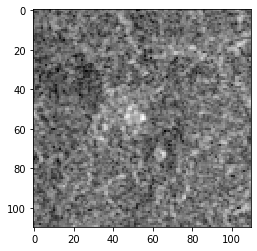

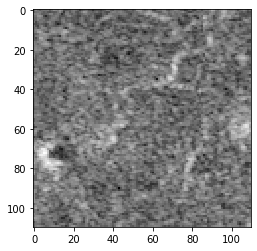

In [10]:
columns = list(train_images.columns)
columns = [float(x) for x in columns]
first_row = np.round(columns).astype(np.int64)

image = first_row.reshape((110,110))
plt.imshow(image,cmap="gray")

columns = list(test_images.columns)
columns = [float(x) for x in columns]
first_row = np.round(columns).astype(np.int64)

image = first_row.reshape((110,110))
plt.figure()
plt.imshow(image,cmap="gray")

plt.show()

Agora as imagens e as labels possuem quantidades congruentes.

In [11]:
train_images.loc[-1] = first_row
train_images.index += 1
train_images.sort_index(inplace=True)

columns = list(test_images.columns)
columns = [float(x) for x in columns]
first_row = np.round(columns).astype(np.int64)

test_images.loc[-1] = first_row
test_images.index += 1
test_images.sort_index(inplace=True)

#dimensao dataset de treino
print("dataset treino")
print(train_images.shape)
print("labels treino")
print(train_labels.shape)

#dimensao dataset de teste
print()
print("dataset teste")
print(test_images.shape)
print("labels teste")
print(test_labels.shape)

dataset treino
(7000, 12100)
labels treino
(7000, 4)

dataset teste
(2734, 12100)
labels teste
(2734, 4)


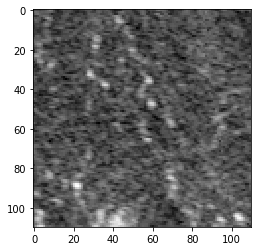

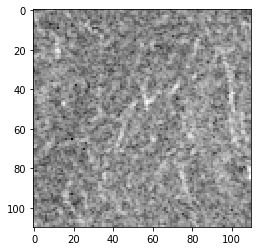

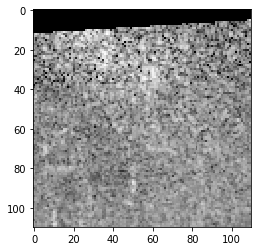

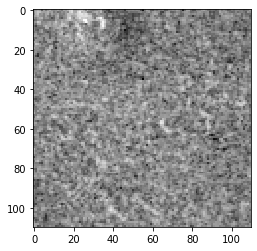

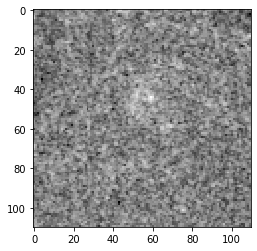

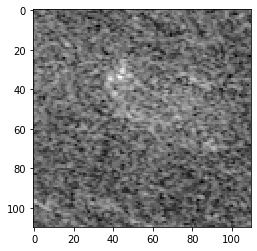

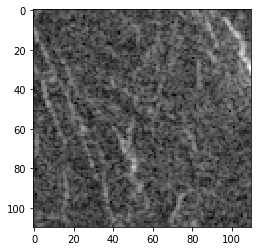

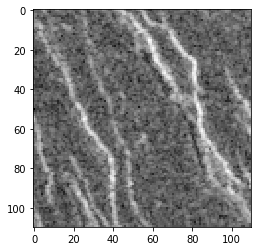

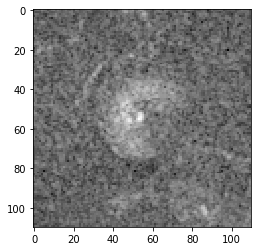

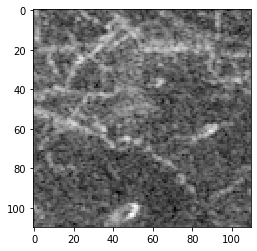

In [33]:
#10 primeiras imagens 
for i in range(10):
    row = np.array(train_images.iloc[i])
    image = row.reshape((110,110))
    plt.figure()
    plt.imshow(image, cmap="gray")

plt.show()

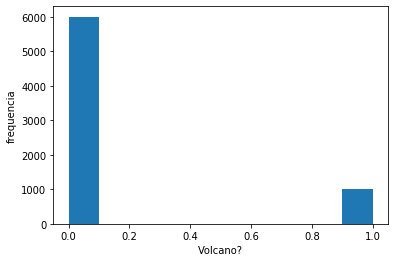

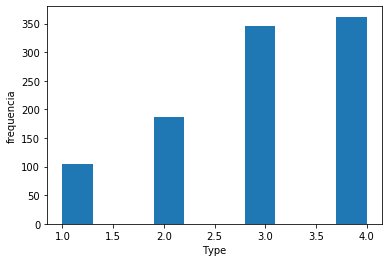

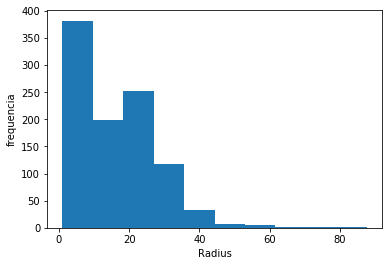

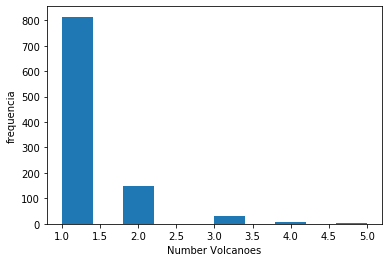

In [4]:
for x in train_labels.keys():
    X = train_labels[x]
    plt.figure()
    plt.hist(X)
    plt.xlabel(x)
    plt.ylabel('frequencia')
plt.show()

### 4. Árvore de decisão

Realizando o treinamento do modelo, podemos prever quase todos os atributos, exceto pelo Radius, que é uma feature impossível de prever por classificação, pois não existe uma classe para este. Conseguiremos esse resultado efetuando uma regressão, mais a frente.

Agora temos o dataframe chamado **predclf**, com as predições das colunas 'Volcano?', 'Type' e 'Number Volcanoes'.

In [39]:

X_train = np.array(train_images)

#tirando o raio pois é uma classificacao e nao existe regra para o tamanho de um raio
#é necessario fazer uma regressao para estimar o tamanho desse raio

y_train = np.array(train_labels.drop(['Radius'],1)) 

X_test = np.array(test_images)
y_test = np.array(test_labels.drop(['Radius'],1)) 
 

#treinando o modelo com os df de treino
clf = DecisionTreeClassifier()
treeP = clf.fit(X_train, y_train)

#treeP = clf.fit(X_train, y_train)

#predicao do df de teste
pred = clf.predict(X_test)
predclf = pd.DataFrame(pred)

#nomeando colunas
predclf.columns = ['Volcano?','Type','Number Volcanoes']

print(predclf.head())

   Volcano?  Type  Number Volcanoes
0       1.0   3.0               1.0
1       0.0   0.0               0.0
2       1.0   1.0               2.0
3       0.0   0.0               0.0
4       1.0   3.0               1.0


A arvore fica completamente ilegivel, porque cada pixel se torna uma feature, sendo assim, **12100** nós. Arvores não são recomendadas para classificação de imagem.

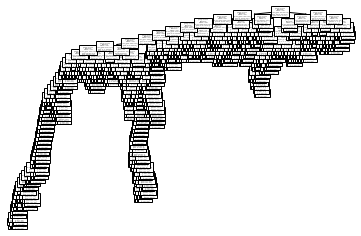

In [40]:
tree.plot_tree(treeP) 
plt.show()

In [43]:
fi = treeP.feature_importances_

np.sort(fi)

array([0.        , 0.        , 0.        , ..., 0.03416984, 0.05064338,
       0.11944088])

### 5. Matriz de confusao

Agora, iremos fazer a comparação de cada atributo estimado com o Ground Truth e gerar a matriz de confusão.

Antes, teremos que colocá-los no mesmo tipo.

In [44]:

labels_no_radius = test_labels.drop(['Radius'],1)

print(labels_no_radius["Volcano?"])
print()
print(predclf["Volcano?"])

#Tipos diferentes

0       0
1       0
2       1
3       0
4       1
       ..
2729    0
2730    0
2731    0
2732    0
2733    0
Name: Volcano?, Length: 2734, dtype: int64

0       1.0
1       0.0
2       1.0
3       0.0
4       1.0
       ... 
2729    0.0
2730    0.0
2731    0.0
2732    0.0
2733    0.0
Name: Volcano?, Length: 2734, dtype: float64


In [100]:
volcan_real = labels_no_radius["Volcano?"]

volcan_pred = predclf["Volcano?"].astype(np.int64)

print(volcan_pred)

0       0
1       0
2       1
3       0
4       1
       ..
2729    0
2730    0
2731    0
2732    0
2733    1
Name: Volcano?, Length: 2734, dtype: int64


In [122]:
from sklearn.metrics import confusion_matrix

#y_true = volcan_real.argmax(axis=1)
#y_pred = volcan_pred.argmax(axis=1)


def cm_(y, p, c_name, labels):
    y_true = y
    y_pred = p


    cm = confusion_matrix(y_true, y_pred, labels)

    print(cm)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm)
    plt.title(f'Matriz de confusao do {c_name}')
    fig.colorbar(cax)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

Matriz de confusão para os valores de Volcano?

É possível observar que o 0 teve 2193 acertos, sendo confundido com o 1 194 vezes

Enquanto o 1 teve sua predição 240 vezes certas, sendo confundido com o 0 107 vezes

[[2193  107]
 [ 194  240]]


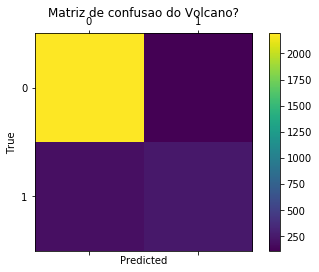

In [123]:
cm_(volcan_real.values, volcan_pred.values, "Volcano?", [0, 1])



Matriz de confusão para os valores de Type

A unica predição que teve mais acertos que erros (em atributos individuais) foi para o 4, com 62 acertos, sendo confundindo com o 3 17 vezez, com o 2 15, 1 7, 0 24.

[[2193    5   17   61   24]
 [  12    3    5    8    7]
 [  38    5   12   18   15]
 [ 101    5   10   15   17]
 [  43   21   18   19   62]]


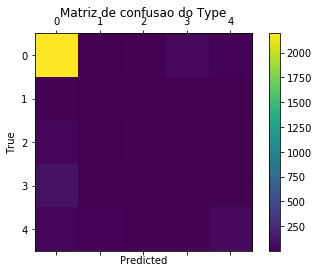

In [124]:
type_real = labels_no_radius["Type"]
type_pred = predclf["Type"]

cm_(type_real.values, type_pred.values, "Type", [0,1,2,3,4])

Matriz de confusão para os valores de Numero de Vulcoes

Onde nao houve nenhuma instancia de do numero 5 no Ground Truth, porém nos dados preditos existe uma unica aparição.

[[2193   85   20    2    0    0]
 [ 167  151   31    7    2    1]
 [  25   34    3    1    0    0]
 [   2    9    1    0    0    0]
 [   0    0    0    0    0    0]
 [   0    0    0    0    0    0]]


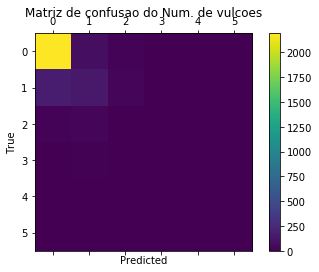

In [133]:
nvolcan_real = labels_no_radius['Number Volcanoes']
nvolcan_pred = predclf["Number Volcanoes"]

cm_(nvolcan_real.values, nvolcan_pred.values, "Num. de vulcoes", [0,1,2,3,4,5])

### 6. Regressão

Agora com todos os valores preditos, podemos fazer uma estimativa do raio do vulcão com uma regressão e depois juntá-los em um só dataset.

A regressão Lasso foi utilizada.

In [12]:
new_train_data = train_images[(train_labels['Volcano?'] == 1)].join(train_labels[(train_labels['Volcano?'] == 1)].drop(['Radius','Volcano?'],1))
new_train_labels = train_labels['Radius'][(train_labels['Volcano?'] == 1)]

new_test_data = test_images[(predclf['Volcano?'] == 1)].join(predclf[(predclf['Volcano?'] == 1)].drop(['Volcano?'],1))
new_test_labels = test_labels['Radius'][(predclf['Volcano?'] == 1)]

X_train = np.array(new_train_data)
y_train = np.array(new_train_labels)

X_test = np.array(new_test_data)
y_test = np.array(new_test_labels)

reg = Lasso()
reg.fit(X_train,y_train)

pred = reg.predict(X_test)
predreg = pd.DataFrame(pred)

predreg.columns = ['Radius']

print(predreg.head())

      Radius
0  26.486052
1  20.137682
2  21.951502
3  22.108023
4  15.119087


C:\Users\bruno\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 750.6541422675864, tolerance: 13.518874347474584
  positive)


In [13]:
pred_radius = []
y = 0
for x in range(predclf.shape[0]):
    if predclf['Volcano?'].iloc[x] == 1.0:
        pred_radius.append(predreg['Radius'].iloc[y])
        y+=1
    else:
        pred_radius.append(0.)

pred_radius = pd.DataFrame({'Radius': pred_radius})

total_pred = predclf.join(pred_radius)

print(total_pred.head())

   Volcano?  Type  Number Volcanoes     Radius
0       0.0   0.0               0.0   0.000000
1       0.0   0.0               0.0   0.000000
2       1.0   3.0               2.0  26.486052
3       0.0   0.0               0.0   0.000000
4       1.0   2.0               1.0  20.137682


In [14]:
cols = ['Volcano?','Type','Radius','Number Volcanoes']
total_pred = total_pred[cols]

print(total_pred)

      Volcano?  Type     Radius  Number Volcanoes
0          0.0   0.0   0.000000               0.0
1          0.0   0.0   0.000000               0.0
2          1.0   3.0  26.486052               2.0
3          0.0   0.0   0.000000               0.0
4          1.0   2.0  20.137682               1.0
...        ...   ...        ...               ...
2729       0.0   0.0   0.000000               0.0
2730       0.0   0.0   0.000000               0.0
2731       0.0   0.0   0.000000               0.0
2732       0.0   0.0   0.000000               0.0
2733       0.0   0.0   0.000000               0.0

[2734 rows x 4 columns]


### 7. Resultados

Com todos os dados em mãos, basta plotar as imagens que o modelo julga ser um vulcão. 
De 2733 imagens, 362 vulcões foram achados.

C:\Users\bruno\anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


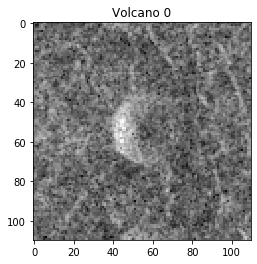

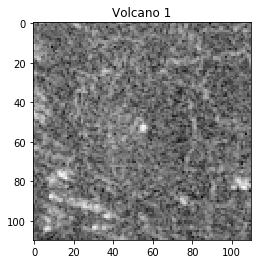

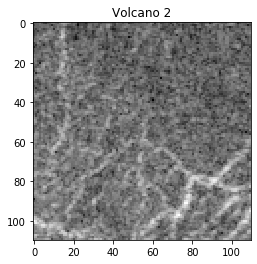

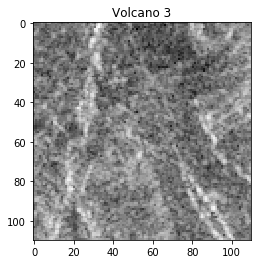

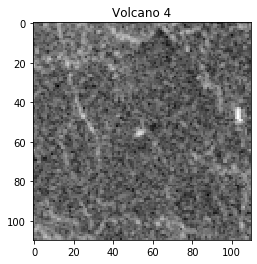

...

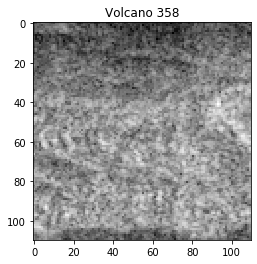

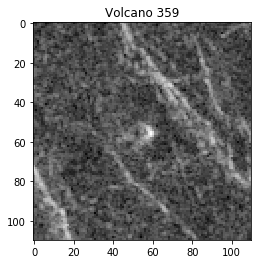

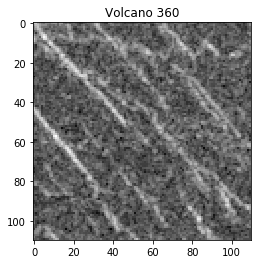

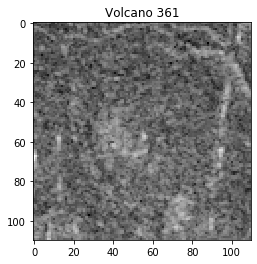

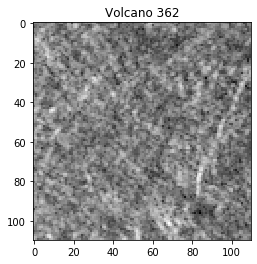

In [15]:
detected = test_images[(total_pred['Volcano?'] == 1)]

for i in range(detected.shape[0]):
    image_flat = np.array(detected.iloc[i])
    image = image_flat.reshape((110,110))

    plt.figure()
    plt.imshow(image,cmap='gray')
    plt.title('Vulcao '+str(i))

plt.show()